In [2]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import copy

import os
import cv2
import skimage as ski
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
Image.MAX_IMAGE_PIXELS = None

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

from st_processing import dis_two_point,get_chip_coord,get_distance_from_point_to_line,get_HE_mask,get_piexl_coods,get_piexl_coods_Mchip,getLinearEquation_new
from st_processing import rgb2gray,adata_flip,adata_Srotate,trans_pN,make_uniq_list
from st_processing import get_adata_STARsolo,get_adata_STARsolo_10x
from st_processing import load_image

def adata_filter_norm_process(adata_raw,min_cells_num=10,min_genes_num=500,mt_num=40,n_top_genes=12000,use_variable=True,
                              in_tissue=True,image=True,n_clusters=8,scale=False): 
    adata=adata_raw.copy()
    if in_tissue:
        adata = adata[adata.obs["in_tissue"] == '1' ]
    if image:
        adata.uns['crop_coord']= [min(adata.obsm['spatial'][:,0])-100, max(adata.obsm['spatial'][:,0])+100,
               min(adata.obsm['spatial'][:,1])-100, max(adata.obsm['spatial'][:,1])+100]
    else:
         adata.uns['crop_coord']= [min(adata.obsm['spatial'][:,0])-3, max(adata.obsm['spatial'][:,0])+3,
               min(adata.obsm['spatial'][:,1])-3, max(adata.obsm['spatial'][:,1])+3]
    if scale:
        sc.pp.filter_cells(adata, min_genes=min_genes_num)
        sc.pp.filter_genes(adata, min_cells=min_cells_num)
        adata = adata[adata.obs["pct_counts_mt"] < mt_num]
        
        adata.layers['raw'] = adata.X.copy()
        sc.pp.normalize_total(adata,target_sum=1e4)
        adata.layers['norm'] = adata.X.copy()
        sc.pp.log1p(adata)
        adata.raw = adata.copy()
        sc.pp.highly_variable_genes(adata,n_top_genes=n_top_genes) 
        adata=adata[:,adata.var.highly_variable]#adata.raw.to_adata()
        sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
        sc.pp.scale(adata, max_value=10)
        
    else:
        sc.pp.filter_cells(adata, min_genes=min_genes_num)
        sc.pp.filter_genes(adata, min_cells=min_cells_num)
        adata = adata[adata.obs["pct_counts_mt"] < mt_num]
        adata.layers['raw'] = adata.X.copy()
        sc.pp.normalize_total(adata,target_sum=1e4)
        adata.raw = adata.copy()
        sc.pp.log1p(adata)
        sc.pp.highly_variable_genes(adata,n_top_genes=n_top_genes) 

    sc.tl.pca(adata, svd_solver="arpack", use_highly_variable=use_variable)
    sc.pp.neighbors(adata,  use_rep='X_pca', n_neighbors=50)
    sc.tl.umap(adata)
    sc.tl.tsne(adata)
    sc.tl.leiden(adata)
    sc.tl.louvain(adata, resolution=1)
    X_pca = adata.obsm['X_pca'] 
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(X_pca) 
    adata.obs['kmeans'] = kmeans.labels_.astype(str)
    
    print('Sample:  '+list(adata.uns['spatial'].keys())[0])
    print(f"#genes after  filter: {adata.n_vars}")
    print(f"#Spot after  filter: {adata.n_obs}")
    print(f"#Median UMIs : {round( np.median(adata.obs['total_counts']),0)}")
    print(f"#Median Genes : {round(np.median(adata.obs['n_genes_by_counts']),0)}")
    print(f"#Mean UMIs : {round( np.mean(adata.obs['total_counts']),0)}")
    print(f"#Mean Genes : {round(np.mean(adata.obs['n_genes_by_counts']),0)}")
    return adata


color_list=['#1f78b4','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf',
           '#a6cee3','#fdbf6f','#b2df8a','#fb9a99','#cab2d6']
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = 'Arial'

# plt.rcParams['figure.figsize']=(10,10)
# sns.set(style="ticks", font_scale=2)
geneinfo_path='/Public_data/reference/mm10/'

# Import adata

In [2]:
res_um=50 #点直径
channels_num=70 #通道数
barcode_num=70 #barcode数
chip_type='T9'
Barcode_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Barcode-T9-70/'

## sample-1-1 reg7

In [ ]:
sample='sample1-1'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg7'

HE_point1=(384,614)
Spot_point1=(369,556)
HE_point2=(4623,4742)
Spot_point2=(4634, 4634)

line_point_r1c1=(746,676) 
line_point_r1c70=(773,4194)
line_point_r70c1=(4266,632)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-1-8 reg2

In [ ]:
sample='sample1-8'
file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg2'

HE_point1=(586,426)
Spot_point1=(580,387)
HE_point2=(4571,4890)
Spot_point2=(4588, 4789)

line_point_r1c1=(758,667)  
line_point_r1c70=(785,4186)
line_point_r70c1=(4275,624)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-1-9 reg3

In [11]:
sample='sample1-9'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg3'

HE_point1=(627,545)
Spot_point1=(631,451)
HE_point2=(4662,4639)
Spot_point2=(4686, 4586)

line_point_r1c1=(763,776)  
line_point_r1c70=(788,4295) 
line_point_r70c1=(4280,732)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

sample: sample1-9
No Velocyto
Image loading from /histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/T9-sample1-9-HE.png
Image loading from /histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/T9-sample1-9-mask.png
Image loading from /histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/T9-sample1-9-marker.png
Image loading from /histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/T9-sample1-9-spot.png
#Spot in tissue: 1158
#Spot in tissue ratio: 23%
Median UMIs: 24604.0
Median Genes: 6249.0
In tissue(%): 76.0
Reading runtime： 28.0 s
-


## sample-2-4 reg4

In [ ]:
sample='sample2-4'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg4'

HE_point1=(148,482)
Spot_point1=(305,499)
HE_point2=(4587,4485)
Spot_point2=(4740, 4538)

line_point_r1c1=(734,612) 
line_point_r1c70=(735,4130) 
line_point_r70c1=(4260,590)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-2-5 reg5

In [ ]:
sample='sample2-5'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg5'

HE_point1=(266,142)
Spot_point1=(413,190)
HE_point2=(4471,4468)
Spot_point2=(4665, 4491)

line_point_r1c1=(728,597)  
line_point_r1c70=(730,4112)
line_point_r70c1=(4253,575) 

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-2-6 reg6

In [ ]:
sample='sample2-6'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg6'

HE_point1=(228,329)
Spot_point1=(365,350)
HE_point2=(4584,4480)
Spot_point2=(4758, 4488)

line_point_r1c1=(751,611) 
line_point_r1c70=(752,4131) 
line_point_r70c1=(4272,587)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-3-4 reg4

In [ ]:
sample='sample3-4'
file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg4'

HE_point1=(224,442)
Spot_point1=(291,465)
HE_point2=(4468,4499)
Spot_point2=(4531, 4562)

line_point_r1c1=(646,747) 
line_point_r1c70=(649,4254) 
line_point_r70c1=(4163,728) 

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-3-5 reg5

In [ ]:
sample='sample3-5'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg5'

HE_point1=(284,292)
Spot_point1=(330,331)
HE_point2=(4505,4701)
Spot_point2=(4634, 4753)

line_point_r1c1=(642,729) 
line_point_r1c70=(643,4242) 
line_point_r70c1=(4162,713) 

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-3-6 reg6

In [ ]:
sample='sample3-6'
file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg6'

HE_point1=(352,409)
Spot_point1=(377,441)
HE_point2=(4666,4475)
Spot_point2=(4779, 4531)

line_point_r1c1=(614,743) 
line_point_r1c70=(615,4258)
line_point_r70c1=(4131,729)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-1-7 reg1

In [ ]:
sample='sample1-7'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg1'

HE_point1=(420,328)
Spot_point1=(408,234)
HE_point2=(4688,4653)
Spot_point2=(4694, 4582)

line_point_r1c1=(713,704)  # region1(711,811) region2(702,791) region3(696,646) 
line_point_r1c70=(741,4221) # region1(717,4341) region2(711,4315) region3(706,4167) 
line_point_r70c1=(4231,660) # region1(4235,803) region2(4228,785) region3(4221,636) 

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-1-2 reg8

In [ ]:
sample='sample1-2'
file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg8'

HE_point1=(445,447)
Spot_point1=(450,337)
HE_point2=(4745,4616)
Spot_point2=(4774, 4539)

line_point_r1c1=(833,619)  
line_point_r1c70=(859,4138) 
line_point_r70c1=(4349,575)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

## sample-1-3 reg9

In [ ]:
sample='sample1-3'
file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/result_STARsolo/'+sample+'/STARsolo/'
image_file_path='/histor/zhao/pangkun/JupyterLab/Task/Project/MAGIC_seq/Mouse_Adult_Organ_T9_70_50um/data/Image/'
reg='reg9'

HE_point1=(586,426)
Spot_point1=(580,387)
HE_point2=(4571,4890)
Spot_point2=(4588, 4789)

line_point_r1c1=(758,667)  
line_point_r1c70=(785,4186)
line_point_r70c1=(4275,624)

adata=get_adata_STARsolo(sample,chip_type,reg,channels_num,barcode_num,res_um=res_um,only_HE=False,
                        img_file=True,EM=True,Velocyto=False,soloFeatures='GeneFull',raw=True,species='mouse',
                        file_path=file_path,image_file_path=image_file_path,Barcode_file_path=Barcode_file_path,geneinfo_path=geneinfo_path,
                        HE_point1=HE_point1,Spot_point1=Spot_point1,HE_point2=HE_point2,Spot_point2=Spot_point2,
                        line_point_r1c1=line_point_r1c1,line_point_r1c70=line_point_r1c70,line_point_r70c1=line_point_r70c1)
adata.write('/Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/adata_'+sample+'.h5ad')

# Re-importing data

In [3]:
def rmdup_gene(adata):
    adata.var['gene_id']=adata.var_names
    adata.var_names=make_uniq_list(adata.var['Symbol'])
    return adata

st_file='//Project/MAGIC_seq/file/Mouse_Adult_Organ_T9_70_50um/st_adata/'
adata_reg1=sc.read(st_file+'adata_sample1-1.h5ad')
adata_reg2=sc.read(st_file+'adata_sample1-8.h5ad')
adata_reg3=sc.read(st_file+'adata_sample1-9.h5ad')
adata_reg4=sc.read(st_file+'adata_sample2-4.h5ad')
adata_reg5=sc.read(st_file+'adata_sample2-5.h5ad')
adata_reg6=sc.read(st_file+'adata_sample2-6.h5ad')
adata_reg7=sc.read(st_file+'adata_sample3-4.h5ad')
adata_reg8=sc.read(st_file+'adata_sample3-5.h5ad')
adata_reg9=sc.read(st_file+'adata_sample3-6.h5ad')

adata_reg1=rmdup_gene(adata_reg1)
adata_reg2=rmdup_gene(adata_reg2)
adata_reg3=rmdup_gene(adata_reg3)
adata_reg4=rmdup_gene(adata_reg4)
adata_reg5=rmdup_gene(adata_reg5)
adata_reg6=rmdup_gene(adata_reg6)
adata_reg7=rmdup_gene(adata_reg7)
adata_reg8=rmdup_gene(adata_reg8)
adata_reg9=rmdup_gene(adata_reg9)


In [107]:
adata_reg1rep=sc.read(st_file+'adata_sample1-7.h5ad')
adata_reg2rep=sc.read(st_file+'adata_sample1-2.h5ad')
adata_reg3rep=sc.read(st_file+'adata_sample1-3.h5ad')
adata_reg1rep=rmdup_gene(adata_reg1rep)
adata_reg2rep=rmdup_gene(adata_reg2rep)
adata_reg3rep=rmdup_gene(adata_reg3rep)

## Basic Information

## Filtered_norm_cluster

In [6]:
adata_reg1_filtered=adata_filter_norm_process(adata_reg1)
del adata_reg1
adata_reg2_filtered=adata_filter_norm_process(adata_reg2)
del adata_reg2
adata_reg3_filtered=adata_filter_norm_process(adata_reg3)
del adata_reg3
adata_reg1rep_filtered=adata_filter_norm_process(adata_reg1rep)
del adata_reg1rep
adata_reg2rep_filtered=adata_filter_norm_process(adata_reg2rep)
del adata_reg2rep
adata_reg3rep_filtered=adata_filter_norm_process(adata_reg3rep)
del adata_reg3rep
adata_reg4_filtered=adata_filter_norm_process(adata_reg4)
del adata_reg4
adata_reg5_filtered=adata_filter_norm_process(adata_reg5)
del adata_reg5
adata_reg6_filtered=adata_filter_norm_process(adata_reg6)
del adata_reg6
adata_reg7_filtered=adata_filter_norm_process(adata_reg7)
del adata_reg7
adata_reg8_filtered=adata_filter_norm_process(adata_reg8)
del adata_reg8
adata_reg9_filtered=adata_filter_norm_process(adata_reg9)
del adata_reg9

Sample:  sample1-1
#genes after  filter: 18895
#Spot after  filter: 1031
#Median UMIs : 38991.0
#Median Genes : 8922.0
#Mean UMIs : 38488.0
#Mean Genes : 8613.0
Sample:  sample1-8
#genes after  filter: 18152
#Spot after  filter: 691
#Median UMIs : 43493.0
#Median Genes : 9114.0
#Mean UMIs : 46123.0
#Mean Genes : 8858.0
Sample:  sample1-9
#genes after  filter: 17215
#Spot after  filter: 1158
#Median UMIs : 24604.0
#Median Genes : 6249.0
#Mean UMIs : 27378.0
#Mean Genes : 6167.0
Sample:  sample1-7
#genes after  filter: 18421
#Spot after  filter: 1083
#Median UMIs : 30186.0
#Median Genes : 7863.0
#Mean UMIs : 31318.0
#Mean Genes : 7768.0
Sample:  sample1-2
#genes after  filter: 17389
#Spot after  filter: 687
#Median UMIs : 31096.0
#Median Genes : 7992.0
#Mean UMIs : 32364.0
#Mean Genes : 7674.0
Sample:  sample1-3
#genes after  filter: 16960
#Spot after  filter: 1137
#Median UMIs : 22580.0
#Median Genes : 6000.0
#Mean UMIs : 25947.0
#Mean Genes : 6035.0
Sample:  sample2-4
#genes after  fil

In [108]:
adata_reg1rep_filtered=adata_filter_norm_process(adata_reg1rep)
del adata_reg1rep
adata_reg2rep_filtered=adata_filter_norm_process(adata_reg2rep)
del adata_reg2rep
adata_reg3rep_filtered=adata_filter_norm_process(adata_reg3rep)
del adata_reg3rep

Sample:  sample1-7
#genes after  filter: 18421
#Spot after  filter: 1083
#Median UMIs : 30186.0
#Median Genes : 7863.0
#Mean UMIs : 31318.0
#Mean Genes : 7768.0
Sample:  sample1-2
#genes after  filter: 17389
#Spot after  filter: 687
#Median UMIs : 31096.0
#Median Genes : 7992.0
#Mean UMIs : 32364.0
#Mean Genes : 7674.0
Sample:  sample1-3
#genes after  filter: 16960
#Spot after  filter: 1137
#Median UMIs : 22580.0
#Median Genes : 6000.0
#Mean UMIs : 25947.0
#Mean Genes : 6035.0


In [75]:
sc.tl.louvain(adata_reg4_filtered, resolution=0.6)
sc.tl.louvain(adata_reg5_filtered,resolution=1.1)
sc.tl.louvain(adata_reg6_filtered,resolution=0.4)
sc.tl.louvain(adata_reg7_filtered,resolution=0.8)
sc.tl.louvain(adata_reg9_filtered,resolution=0.8)

## Clustering - louvain

meta NOT subset; don't know how to subset; dropped


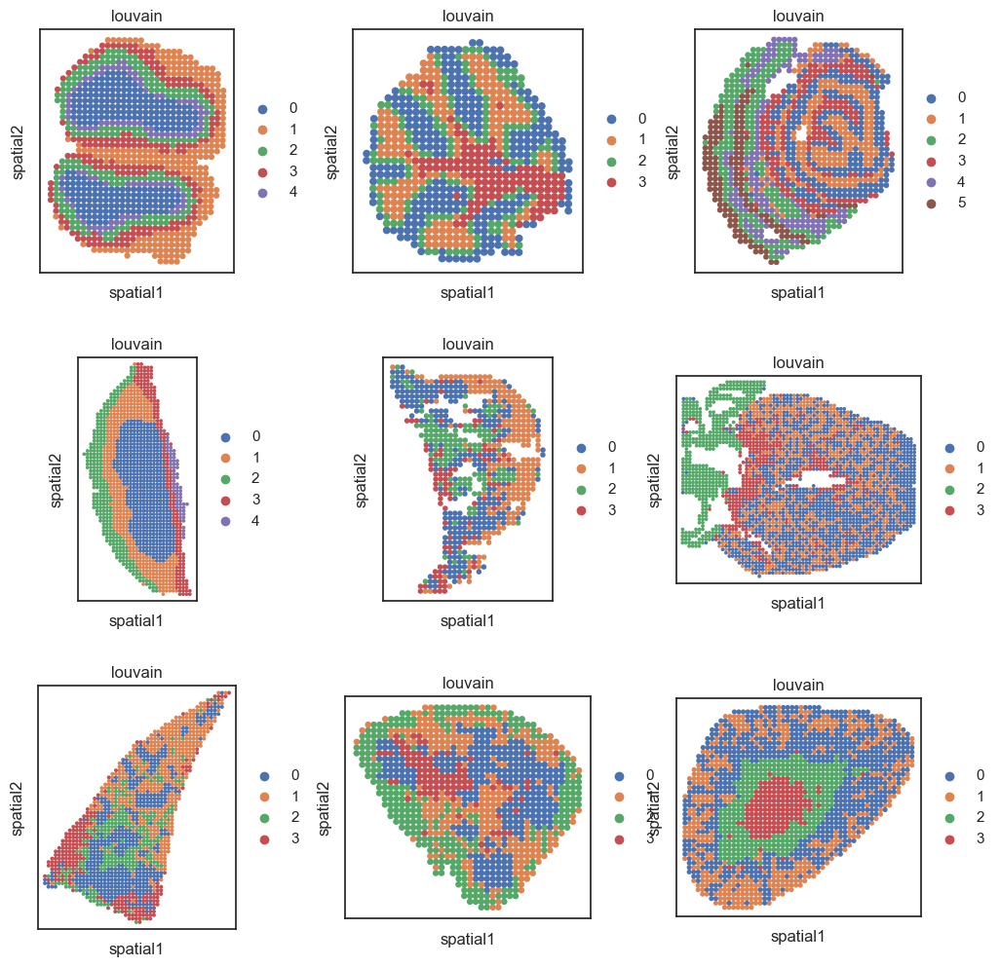

In [76]:
color_list=['#4c72b0','#dd8452','#55a868','#c44e52','#8172b3','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf']
sns.set(style="ticks", font_scale=1)
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,12))
c='louvain'
s=56

sc.pl.spatial(adata_reg1_filtered, img_key=None,spot_size=s,# alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r', 
              basis='spatial' ,palette=color_list,
              crop_coord=adata_reg1_filtered.uns['crop_coord'],
              ax=axes[0,0], show=False)

sc.pl.spatial(adata_reg2_filtered, img_key=None,spot_size=s, #alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r', 
              basis='spatial' ,palette=color_list,
              crop_coord=adata_reg2_filtered.uns['crop_coord'],
              ax=axes[0,1], show=False)

sc.pl.spatial(adata_reg3_filtered, img_key=None,spot_size=s, #alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r',  
              basis='spatial' ,palette=color_list,
              crop_coord= adata_reg3_filtered.uns['crop_coord'],
              ax=axes[0,2], show=False)

sc.pl.spatial(adata_reg4_filtered, img_key=None,spot_size=s, #alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r', 
              basis='spatial' ,palette=color_list,
              crop_coord= adata_reg4_filtered.uns['crop_coord'],
              ax=axes[1,0], show=False)

sc.pl.spatial(adata_reg5_filtered, img_key=None,spot_size=s, #alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r',   
              basis='spatial' ,palette=color_list,
              crop_coord= adata_reg5_filtered.uns['crop_coord'],
              ax=axes[1,1], show=False)

sc.pl.spatial(adata_reg6_filtered, img_key=None,spot_size=s, #alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r',  
              basis='spatial' ,palette=color_list,
              crop_coord=adata_reg6_filtered.uns['crop_coord'],
              ax=axes[1,2], show=False)

sc.pl.spatial(adata_reg7_filtered, img_key=None,spot_size=s, #alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r',  
              basis='spatial' ,palette=color_list,
              crop_coord= adata_reg7_filtered.uns['crop_coord'],
              ax=axes[2,0], show=False)

sc.pl.spatial(adata_reg8_filtered, img_key=None,spot_size=s, #alpha=0.7,#wspace=.3,
              color=[c], cmap='Spectral_r',   
              basis='spatial' ,palette=color_list,
              crop_coord= adata_reg8_filtered.uns['crop_coord'],
              ax=axes[2,1], show=False)

sc.pl.spatial(adata_reg9_filtered, img_key=None,spot_size=s,# alpha=0.8,#wspace=.3,
              color=[c], cmap='Spectral_r',  
              basis='spatial' ,palette=color_list,
              crop_coord= adata_reg9_filtered.uns['crop_coord'],
              ax=axes[2,2], show=False)
plt.subplots_adjust(wspace=.35,hspace=.35)
plt.savefig('../Figure/Figure1/FigureS4-9tissue-louvain.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


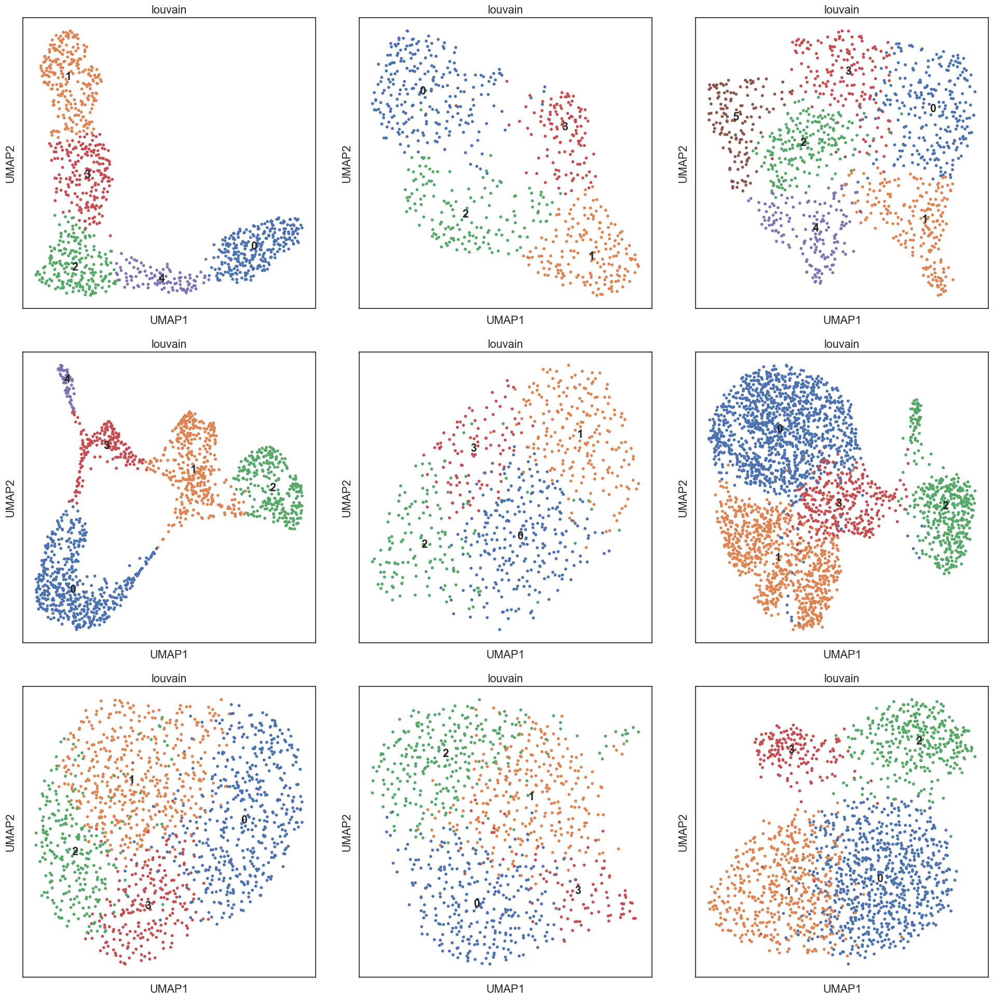

In [77]:
sns.set(style="ticks", font_scale=1.3)
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24,24))
c='louvain'
sc.pl.umap(adata_reg1_filtered, legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r', palette=color_list,
              ax=axes[0,0], show=False)
sc.pl.umap(adata_reg2_filtered, legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r',palette=color_list,
              ax=axes[0,1], show=False)
sc.pl.umap(adata_reg3_filtered,legend_loc='on data', size=70,
              color=[c], cmap='Spectral_r', palette=color_list,
              ax=axes[0,2], show=False)



sc.pl.umap(adata_reg4_filtered, legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r', palette=color_list,
              ax=axes[1,0], show=False)
sc.pl.umap(adata_reg5_filtered, legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r', palette=color_list,
              ax=axes[1,1], show=False)
sc.pl.umap(adata_reg6_filtered,legend_loc='on data', size=70,
              color=[c], cmap='Spectral_r',palette=color_list,
              ax=axes[1,2], show=False)


sc.pl.umap(adata_reg7_filtered, legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r',palette=color_list,
              ax=axes[2,0], show=False)
sc.pl.umap(adata_reg8_filtered, legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r', palette=color_list,
              ax=axes[2,1], show=False)
sc.pl.umap(adata_reg9_filtered,legend_loc='on data',size=70,
              color=[c], cmap='Spectral_r', palette=color_list,
              ax=axes[2,2], show=False)

plt.subplots_adjust(wspace=.15,hspace=.15)
plt.savefig('../Figure/Figure1/FigureS4-9tissue-louvain-umap.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


# rank_genes_groups

In [78]:
sc.tl.rank_genes_groups(adata_reg1_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg2_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg3_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg4_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg5_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg6_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg7_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg8_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
sc.tl.rank_genes_groups(adata_reg9_filtered, groupby='louvain', method='wilcoxon',use_raw =False)

In [79]:
sc.tl.filter_rank_genes_groups(adata_reg1_filtered)
sc.tl.filter_rank_genes_groups(adata_reg2_filtered)
sc.tl.filter_rank_genes_groups(adata_reg3_filtered)
sc.tl.filter_rank_genes_groups(adata_reg4_filtered)
sc.tl.filter_rank_genes_groups(adata_reg5_filtered)
sc.tl.filter_rank_genes_groups(adata_reg6_filtered)
sc.tl.filter_rank_genes_groups(adata_reg7_filtered)
sc.tl.filter_rank_genes_groups(adata_reg8_filtered)
sc.tl.filter_rank_genes_groups(adata_reg9_filtered)



In [80]:
tissue_list=["olfactory_bulb", 
 "cerebellum", 
 "intestines",
 "placenta", 
 "lungs",
 "heart",
 "liver",
 "spleen", 
 "kidney"]
# The top 10 highly differentially expressed genes in each cluster
sc.tl.rank_genes_groups(adata_reg4_filtered, groupby='louvain', method='wilcoxon',use_raw =False)
rank_genes_df_reg = pd.DataFrame(adata_reg4_filtered.uns['rank_genes_groups']['names'])
print(rank_genes_df_reg.head(10))

        0         1         2        3        4
0   Fabp3    Prl8a9      Srgn      Afp   Upk3bl
1    Ctsq  Ceacam14     Htra3      Trf   Col1a1
2   Sin3b     Psg16      Ctsk  Selenop    Krt15
3    Cts6     Psg21    Ctla2a     Apob    Krt6a
4    Lepr     Psg28     Inhba   Spink1  S100a10
5    Ctsj    Prl8a6      Ly6a     Spp2   Col1a2
6    Gjb2     Psg27    Prl8a2     Kng1      Mal
7   Cd320  Ceacam11     H2-K1      Fgb   Col3a1
8   Rhox9     Psg23       Dcn    Apoa1   Col6a2
9  Gm9112     Psg19  AA467197    Apoa4    Krt13


meta NOT subset; don't know how to subset; dropped


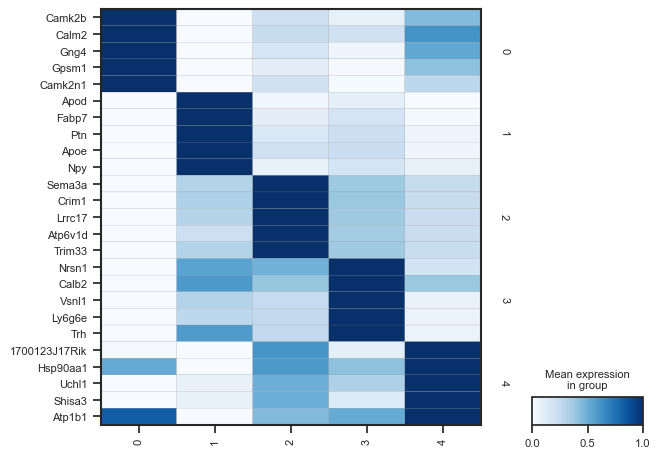

In [81]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg1_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Olfbulb-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


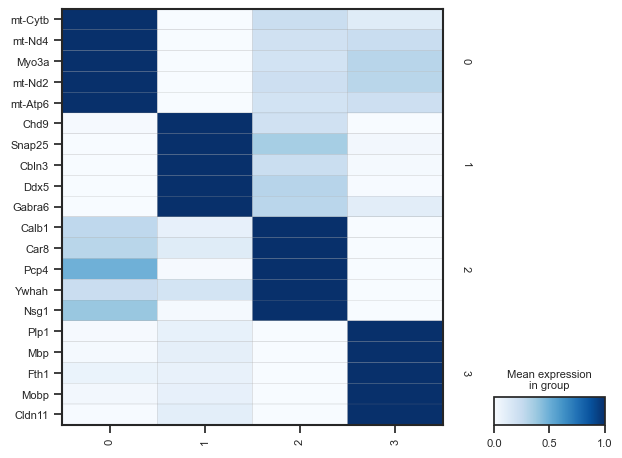

In [82]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg2_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Cere-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


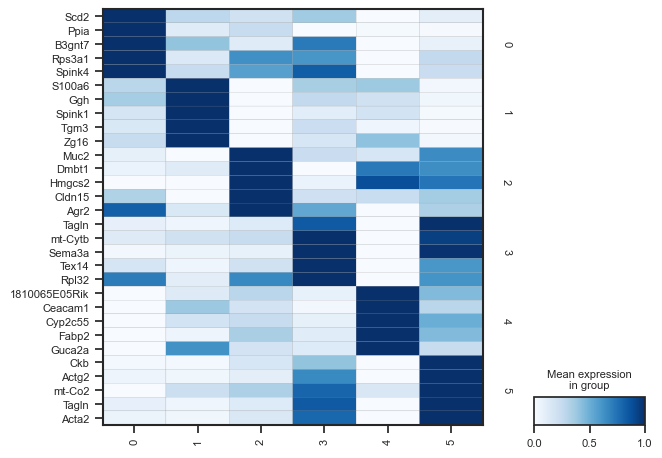

In [83]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg3_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Colon-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


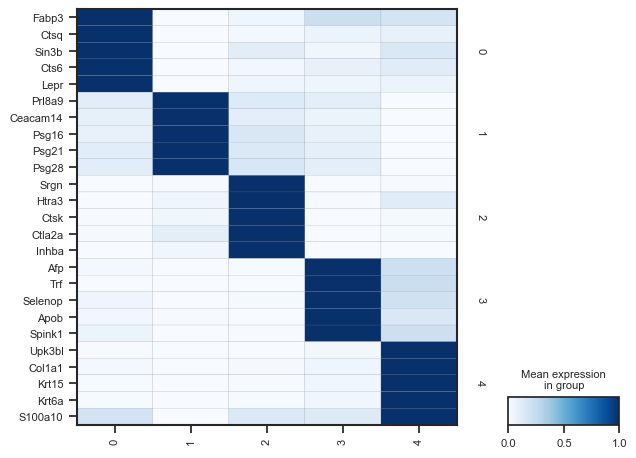

In [84]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg4_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-placenta-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


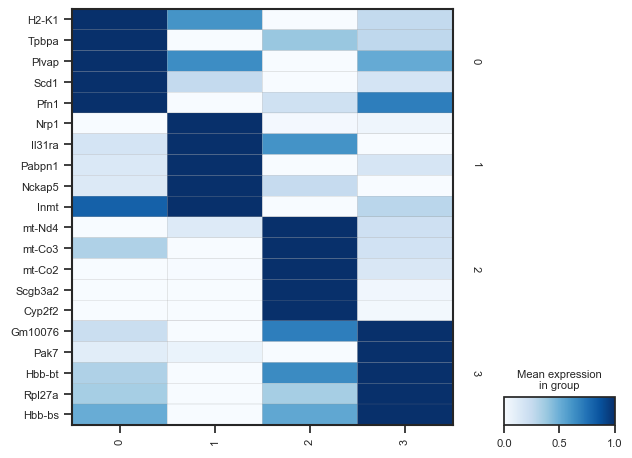

In [85]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg5_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-lung-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


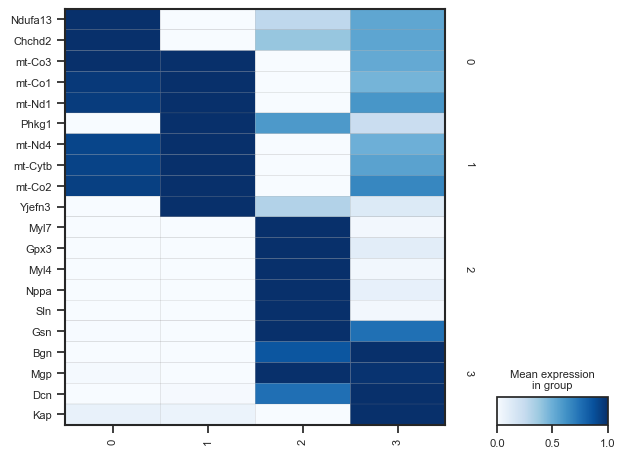

In [86]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg6_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Heart-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


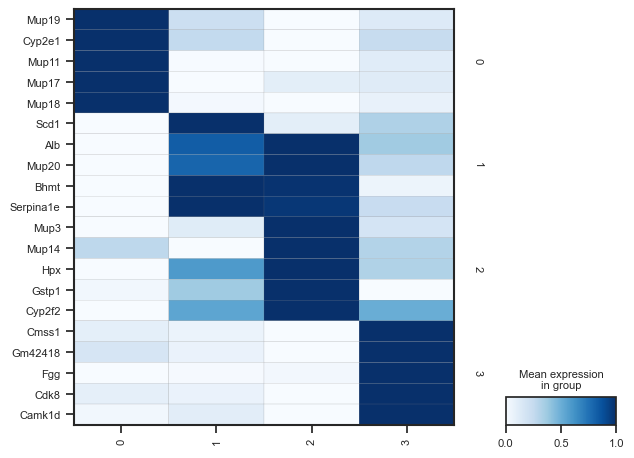

In [87]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg7_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Liver-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


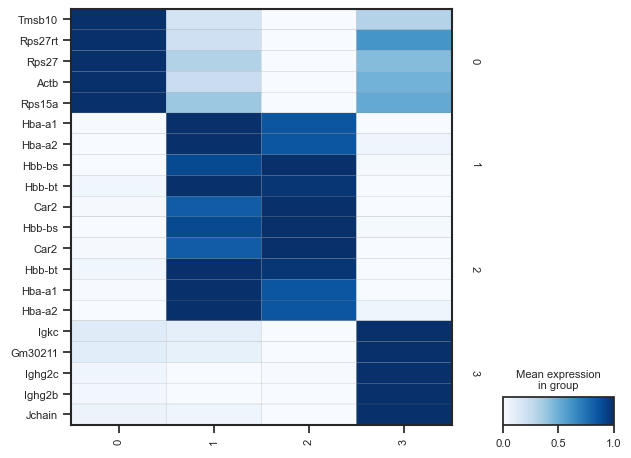

In [88]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg8_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Spleen-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


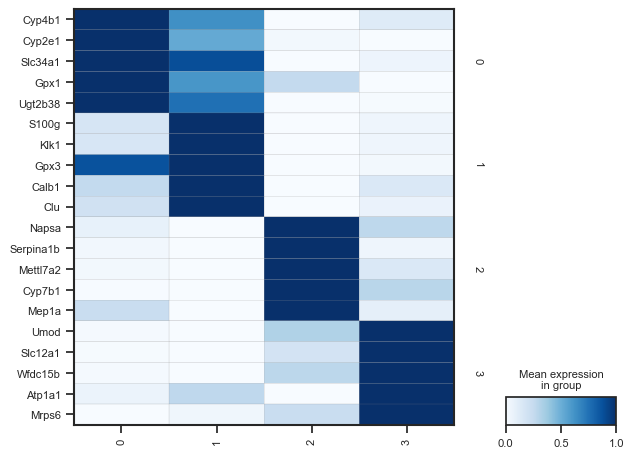

In [89]:
sns.set(style="ticks", font_scale=0.8)
sc.pl.rank_genes_groups_matrixplot(adata_reg9_filtered, n_genes=5,
                                   use_raw=True,
                                   show=False,
                                   groupby=['louvain'],
                                   figsize=(7,5),
                                   dendrogram=False,
                                   standard_scale='var',
                                   swap_axes=True, 
                                   cmap='Blues')
plt.savefig('../Figure/Figure1/Fig1-9tissue-Kidney-marker.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


meta NOT subset; don't know how to subset; dropped


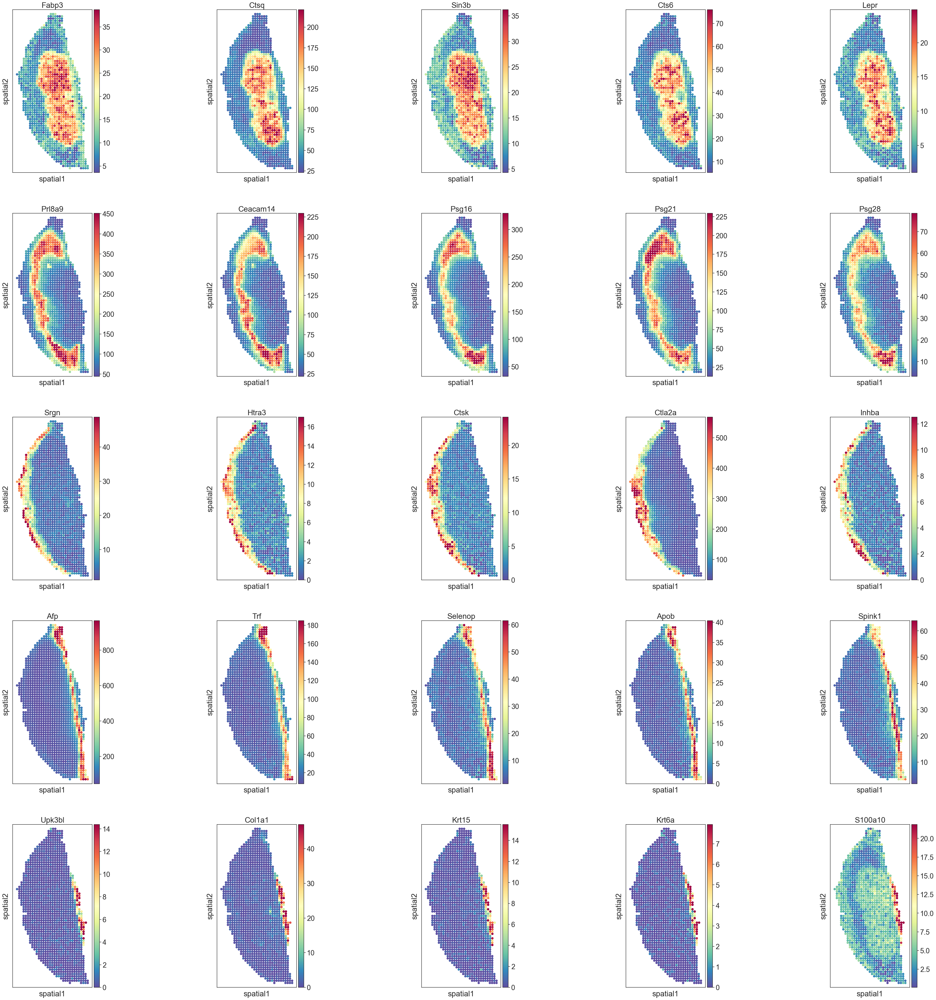

In [90]:
plt.rcParams['figure.figsize']=(10,10)
sns.set(style="ticks", font_scale=2)
i=5
Top_marker_genes=list(rank_genes_df_reg['0'][0:i])+list(rank_genes_df_reg['1'][0:i])+list(rank_genes_df_reg['2'][0:i])+list(rank_genes_df_reg['3'][0:i])+list(rank_genes_df_reg['4'][0:i])
sc.pl.spatial(adata_reg4_filtered, img_key=None,spot_size=53, ncols=5,
              color=Top_marker_genes, cmap='Spectral_r',  vmin='p1',vmax='p99',
              basis='spatial' ,
              crop_coord=adata_reg4_filtered.uns['crop_coord'],
              show=False)
plt.savefig('../Figure/Figure1/Fig1-9tissue-placenta-marker-ST.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')

# UMI-Gene-count

In [92]:
#
tissue_list=["Olfactory_bulb", 
 "Cerebellum", 
 "Intestine",
 "Placenta", 
 "Lung",
 "Heart",
 "Liver",
 "Spleen", 
 "Kidney"]

In [93]:
df_umi_num=pd.DataFrame({'total_counts':list(adata_reg1_filtered.obs['total_counts'])+
list(adata_reg2_filtered.obs['total_counts'])+
list(adata_reg3_filtered.obs['total_counts'])+
list(adata_reg4_filtered.obs['total_counts'])+
list(adata_reg5_filtered.obs['total_counts'])+
list(adata_reg6_filtered.obs['total_counts'])+
list(adata_reg7_filtered.obs['total_counts'])+
list(adata_reg8_filtered.obs['total_counts'])+
list(adata_reg9_filtered.obs['total_counts']),
'n_genes_by_counts':list(adata_reg1_filtered.obs['n_genes_by_counts'])+
list(adata_reg2_filtered.obs['n_genes_by_counts'])+
list(adata_reg3_filtered.obs['n_genes_by_counts'])+
list(adata_reg4_filtered.obs['n_genes_by_counts'])+
list(adata_reg5_filtered.obs['n_genes_by_counts'])+
list(adata_reg6_filtered.obs['n_genes_by_counts'])+
list(adata_reg7_filtered.obs['n_genes_by_counts'])+
list(adata_reg8_filtered.obs['n_genes_by_counts'])+
list(adata_reg9_filtered.obs['n_genes_by_counts']),
 'tissue':['Olfactory_bulb']*adata_reg1_filtered.n_obs+
 ['Cerebellum']*adata_reg2_filtered.n_obs+
 ['Intestine']*adata_reg3_filtered.n_obs+
 ['Placenta']*adata_reg4_filtered.n_obs+
 ['Lung']*adata_reg5_filtered.n_obs+
 ['Heart']*adata_reg6_filtered.n_obs+
 ['Liver']*adata_reg7_filtered.n_obs+
 ['Spleen']*adata_reg8_filtered.n_obs+
 ['Kidney']*adata_reg9_filtered.n_obs})

meta NOT subset; don't know how to subset; dropped


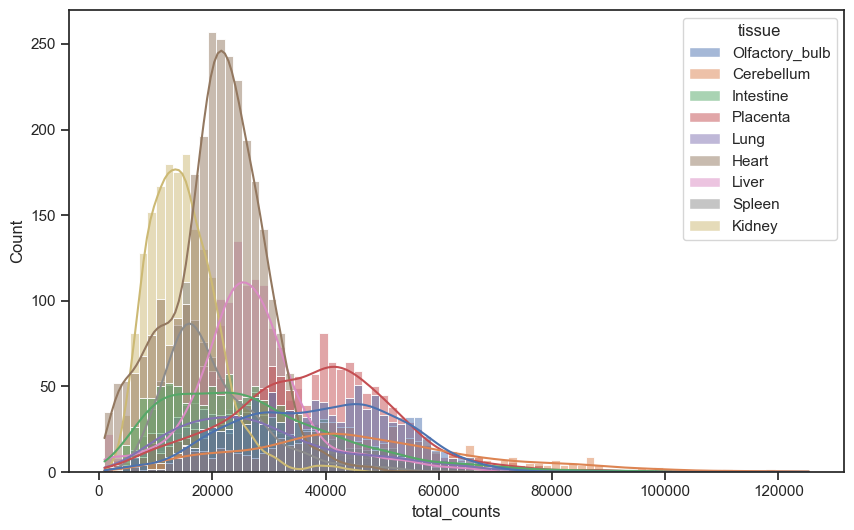

In [94]:
# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style='ticks')

sns.histplot(data=df_umi_num, x="total_counts", hue="tissue",kde=True)
#plt.show()

plt.savefig('../Figure/Figure1/Fig1-9tissue-total_counts-density.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


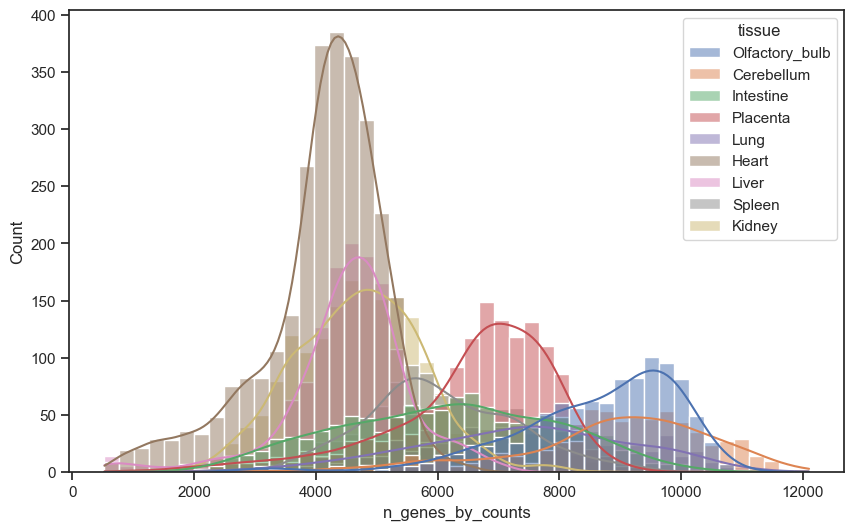

In [95]:
# libraries & dataset
import seaborn as sns
plt.figure(figsize=(10,6))
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style='ticks')
sns.histplot(data=df_umi_num, x="n_genes_by_counts", hue="tissue",kde=True)
#plt.show()

plt.savefig('../Figure/Figure1/Fig1-9tissue-gene-number-density.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


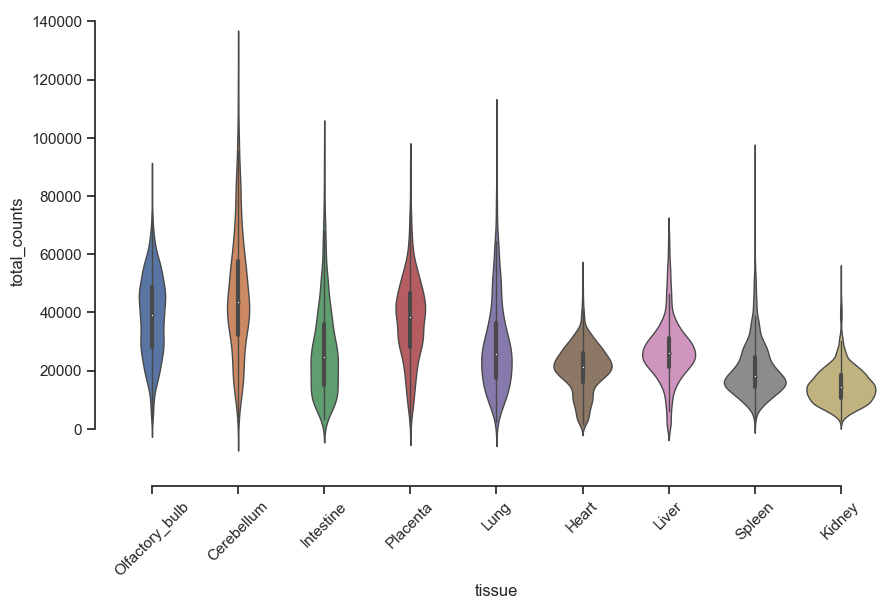

In [96]:
plt.figure(figsize=(10,6))
sns.violinplot(x='tissue', y='total_counts', data=df_umi_num, order=tissue_list,linewidth=1)
sns.despine(offset=10, trim=True)
#sns.swarmplot(x="tissue", y="total_counts", data=df_umi_num, color="w", alpha=.5)
plt.xticks(rotation=45)
#plt.show()
plt.savefig('../Figure/Figure1/Fig1-9tissue-umi-count.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


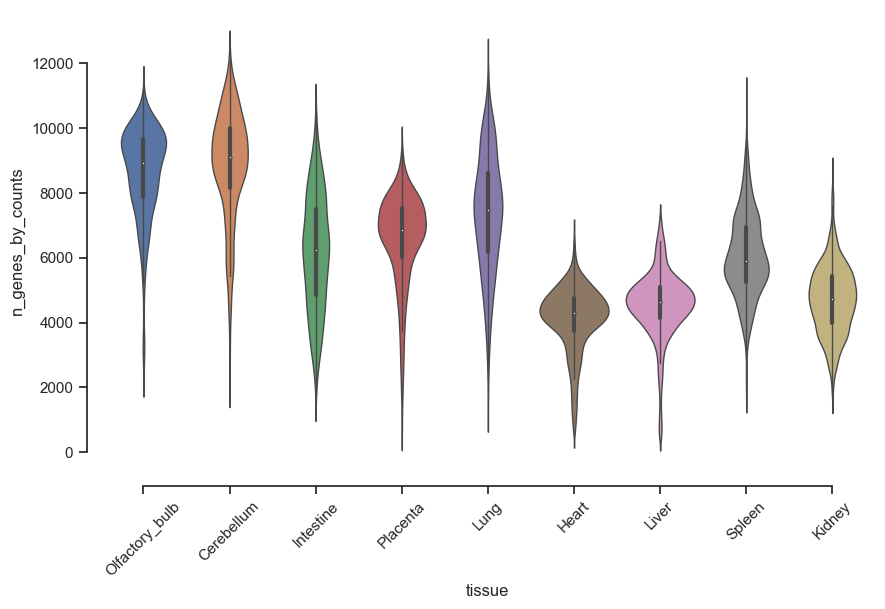

In [97]:
plt.figure(figsize=(10,6))
sns.violinplot(x='tissue', y='n_genes_by_counts', data=df_umi_num, order=tissue_list,linewidth=1)
sns.despine(offset=10, trim=True)
plt.xticks(rotation=45)
#plt.show()
plt.savefig('../Figure/Figure1/Fig1-9tissue-gene-number.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')

# Merge adata

In [109]:
import scanpy.external as sce
adata_reg1_filtered.obs['reg']='Olfactory_bulb-1'
adata_reg2_filtered.obs['reg']='Cerebellum-1'
adata_reg3_filtered.obs['reg']='Intestine-1'
adata_reg1rep_filtered.obs['reg']='Olfactory_bulb-2'
adata_reg2rep_filtered.obs['reg']='Cerebellum-2'
adata_reg3rep_filtered.obs['reg']='Intestine-2'
adata_reg_1 = adata_reg1_filtered.concatenate(adata_reg1rep_filtered)
adata_reg_2 = adata_reg2_filtered.concatenate(adata_reg2rep_filtered)
adata_reg_3 = adata_reg3_filtered.concatenate(adata_reg3rep_filtered)





In [112]:
def adata_cluster_process(adata,resolution=1):
    sc.pp.highly_variable_genes(adata,n_top_genes=2000) 
    sc.tl.pca(adata, svd_solver="arpack", use_highly_variable=True)
    sc.pp.neighbors(adata,  use_rep='X_pca', n_neighbors=50)
    sc.tl.umap(adata)
    sc.tl.leiden(adata)
    sc.tl.louvain(adata, resolution=resolution)
    return adata
adata_reg_1=adata_cluster_process(adata_reg_1)
adata_reg_2=adata_cluster_process(adata_reg_2)
adata_reg_3=adata_cluster_process(adata_reg_3)

sc.tl.louvain(adata_reg_1, resolution=1.2)
sc.tl.louvain(adata_reg_2, resolution=0.8)
sc.tl.louvain(adata_reg_3, resolution=0.6)

# 合并后的聚类信息
adata_reg1_filtered.obs['louvain']=list(adata_reg_1[adata_reg_1.obs['reg']=='Olfactory_bulb-1'].obs['louvain'])
adata_reg2_filtered.obs['louvain']=list(adata_reg_2[adata_reg_2.obs['reg']=='Cerebellum-1'].obs['louvain'])
adata_reg3_filtered.obs['louvain']=list(adata_reg_3[adata_reg_3.obs['reg']=='Intestine-1'].obs['louvain'])

adata_reg1rep_filtered.obs['louvain']=list(adata_reg_1[adata_reg_1.obs['reg']=='Olfactory_bulb-2'].obs['louvain'])
adata_reg2rep_filtered.obs['louvain']=list(adata_reg_2[adata_reg_2.obs['reg']=='Cerebellum-2'].obs['louvain'])
adata_reg3rep_filtered.obs['louvain']=list(adata_reg_3[adata_reg_3.obs['reg']=='Intestine-2'].obs['louvain'])

meta NOT subset; don't know how to subset; dropped


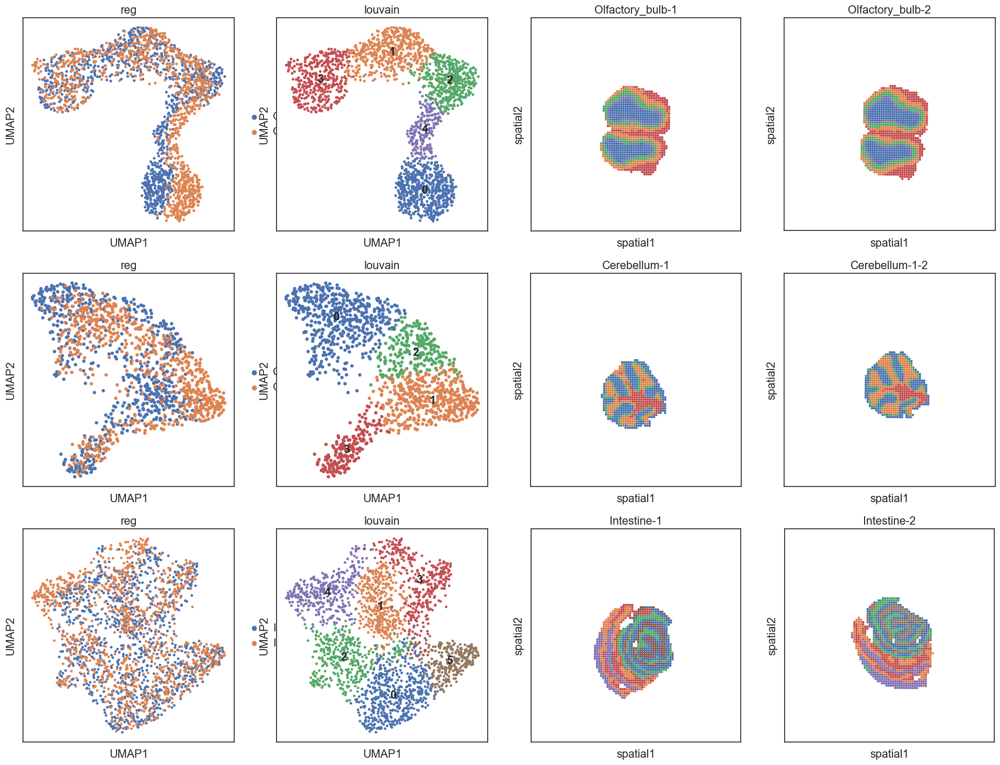

In [114]:
sns.set(style="ticks", font_scale=1.3)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(24,18))
# sc.tl.louvain(adata_reg_1, resolution=1.2)
# sc.tl.louvain(adata_reg_2, resolution=0.8)
# sc.tl.louvain(adata_reg_3, resolution=0.6)

sc.pl.umap(adata_reg_1, color=['reg'], 
              ax=axes[0,0], show=False)
sc.pl.umap(adata_reg_1, color=['louvain'], legend_loc='on data',
              ax=axes[0,1], show=False)
sc.pl.spatial(adata_reg1_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg1_filtered.uns['HE_col'],
                           0, adata_reg1_filtered.uns['HE_row']],
              legend_loc=None,
              title='Olfactory_bulb-1',
              ax=axes[0,2], show=False)
sc.pl.spatial(adata_reg1rep_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg1rep_filtered.uns['HE_col'],
                           0, adata_reg1rep_filtered.uns['HE_row']],
              legend_loc=None,
              title='Olfactory_bulb-2',
              ax=axes[0,3], show=False)

sc.pl.umap(adata_reg_2, color=['reg'], 
              ax=axes[1,0], show=False)
sc.pl.umap(adata_reg_2, color=['louvain'], legend_loc='on data',
              ax=axes[1,1], show=False)
sc.pl.spatial(adata_reg2_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg2_filtered.uns['HE_col'],
                           0, adata_reg2_filtered.uns['HE_row']],
              legend_loc=None,
              title='Cerebellum-1',
              ax=axes[1,2], show=False)
sc.pl.spatial(adata_reg2rep_filtered, img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg2rep_filtered.uns['HE_col'],
                           0, adata_reg2rep_filtered.uns['HE_row']],
              legend_loc=None,
              title='Cerebellum-1-2',
              ax=axes[1,3], show=False)

sc.pl.umap(adata_reg_3, color=['reg'], 
              ax=axes[2,0], show=False)
sc.pl.umap(adata_reg_3, color=['louvain'], legend_loc='on data',
              ax=axes[2,1], show=False)
sc.pl.spatial(adata_reg3_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg3_filtered.uns['HE_col'],
                           0, adata_reg3_filtered.uns['HE_row']],
              legend_loc=None,
              title='Intestine-1',
              ax=axes[2,2], show=False)


sc.pl.spatial(adata_reg3rep_filtered, img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r',
              crop_coord= [0, adata_reg3rep_filtered.uns['HE_col'],
                           0, adata_reg3rep_filtered.uns['HE_row']],
             legend_loc=None,
              title='Intestine-2',
              ax=axes[2,3], show=False)

plt.subplots_adjust(wspace=.2,hspace=.2)
plt.savefig('../Figure/Figure1/Fig1-3sample-rep-louvain-Noback.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')

## harmony_integrate

In [115]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata_reg_1, 'reg')
sc.pp.neighbors(adata_reg_1,  use_rep='X_pca_harmony', n_neighbors=50)
sc.tl.umap(adata_reg_1)
sc.tl.leiden(adata_reg_1)
sc.tl.louvain(adata_reg_1, resolution=1)

sce.pp.harmony_integrate(adata_reg_2, 'reg')
sc.pp.neighbors(adata_reg_2,  use_rep='X_pca_harmony', n_neighbors=50)
sc.tl.umap(adata_reg_2)
sc.tl.leiden(adata_reg_2)
sc.tl.louvain(adata_reg_2, resolution=1)

sce.pp.harmony_integrate(adata_reg_3, 'reg')
sc.pp.neighbors(adata_reg_3,  use_rep='X_pca_harmony', n_neighbors=50)
sc.tl.umap(adata_reg_3)
sc.tl.leiden(adata_reg_3)
sc.tl.louvain(adata_reg_3, resolution=1)

2024-05-19 12:25:20,337 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-19 12:25:22,154 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-19 12:25:22,164 - harmonypy - INFO - Iteration 1 of 10
2024-05-19 12:25:22,479 - harmonypy - INFO - Iteration 2 of 10
2024-05-19 12:25:22,779 - harmonypy - INFO - Iteration 3 of 10
2024-05-19 12:25:23,076 - harmonypy - INFO - Iteration 4 of 10
2024-05-19 12:25:23,373 - harmonypy - INFO - Iteration 5 of 10
2024-05-19 12:25:23,671 - harmonypy - INFO - Iteration 6 of 10
2024-05-19 12:25:23,968 - harmonypy - INFO - Iteration 7 of 10
2024-05-19 12:25:24,311 - harmonypy - INFO - Iteration 8 of 10
2024-05-19 12:25:24,468 - harmonypy - INFO - Iteration 9 of 10
2024-05-19 12:25:24,587 - harmonypy - INFO - Converged after 9 iterations
2024-05-19 12:25:36,591 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-19 12:25:37,714 - harmonypy - INFO - sklearn.KMeans initialization complet

In [116]:
sc.tl.louvain(adata_reg_1, resolution=1.2)
sc.tl.louvain(adata_reg_2, resolution=0.8)
sc.tl.louvain(adata_reg_3, resolution=0.6)

In [117]:
# 合并后的聚类信息
adata_reg1_filtered.obs['louvain']=list(adata_reg_1[adata_reg_1.obs['reg']=='Olfactory_bulb-1'].obs['louvain'])
adata_reg2_filtered.obs['louvain']=list(adata_reg_2[adata_reg_2.obs['reg']=='Cerebellum-1'].obs['louvain'])
adata_reg3_filtered.obs['louvain']=list(adata_reg_3[adata_reg_3.obs['reg']=='Intestine-1'].obs['louvain'])

adata_reg1rep_filtered.obs['louvain']=list(adata_reg_1[adata_reg_1.obs['reg']=='Olfactory_bulb-2'].obs['louvain'])
adata_reg2rep_filtered.obs['louvain']=list(adata_reg_2[adata_reg_2.obs['reg']=='Cerebellum-2'].obs['louvain'])
adata_reg3rep_filtered.obs['louvain']=list(adata_reg_3[adata_reg_3.obs['reg']=='Intestine-2'].obs['louvain'])

meta NOT subset; don't know how to subset; dropped


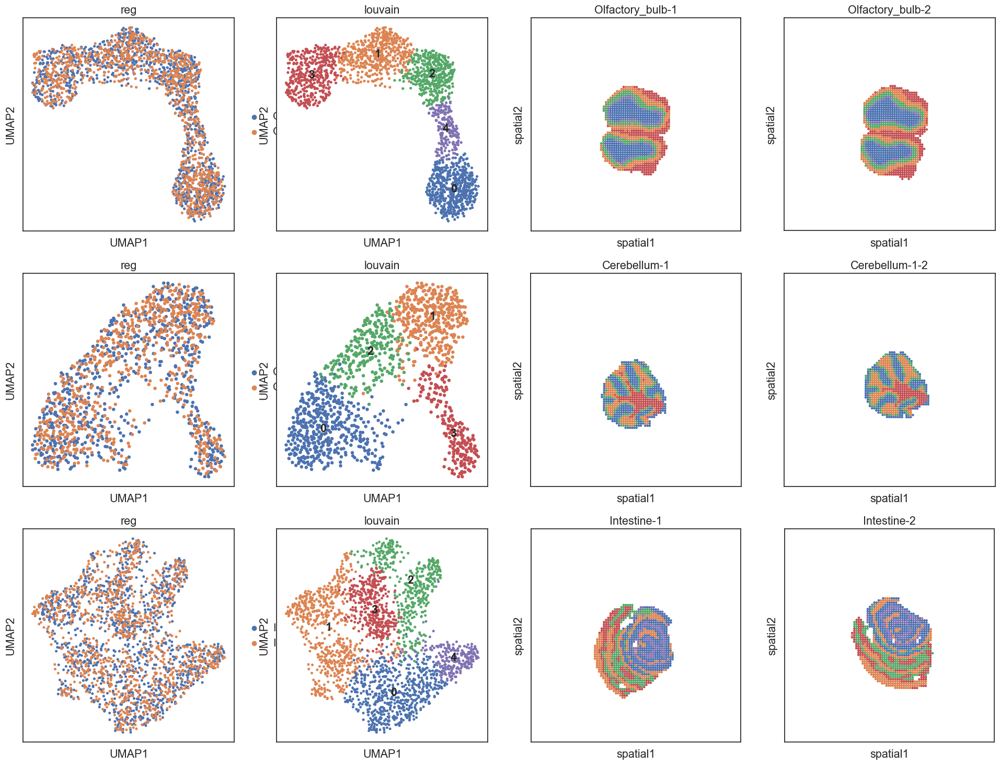

In [119]:
sns.set(style="ticks", font_scale=1.3)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(24,18))
# sc.tl.louvain(adata_reg_1, resolution=1.2)
# sc.tl.louvain(adata_reg_2, resolution=0.8)
# sc.tl.louvain(adata_reg_3, resolution=0.6)

sc.pl.umap(adata_reg_1, color=['reg'], 
              ax=axes[0,0], show=False)
sc.pl.umap(adata_reg_1, color=['louvain'], legend_loc='on data',
              ax=axes[0,1], show=False)
sc.pl.spatial(adata_reg1_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg1_filtered.uns['HE_col'],
                           0, adata_reg1_filtered.uns['HE_row']],
              legend_loc=None,
              title='Olfactory_bulb-1',
              ax=axes[0,2], show=False)
sc.pl.spatial(adata_reg1rep_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg1rep_filtered.uns['HE_col'],
                           0, adata_reg1rep_filtered.uns['HE_row']],
              legend_loc=None,
              title='Olfactory_bulb-2',
              ax=axes[0,3], show=False)

sc.pl.umap(adata_reg_2, color=['reg'], 
              ax=axes[1,0], show=False)
sc.pl.umap(adata_reg_2, color=['louvain'], legend_loc='on data',
              ax=axes[1,1], show=False)
sc.pl.spatial(adata_reg2_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg2_filtered.uns['HE_col'],
                           0, adata_reg2_filtered.uns['HE_row']],
              legend_loc=None,
              title='Cerebellum-1',
              ax=axes[1,2], show=False)
sc.pl.spatial(adata_reg2rep_filtered, img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg2rep_filtered.uns['HE_col'],
                           0, adata_reg2rep_filtered.uns['HE_row']],
              legend_loc=None,
              title='Cerebellum-1-2',
              ax=axes[1,3], show=False)

sc.pl.umap(adata_reg_3, color=['reg'], 
              ax=axes[2,0], show=False)
sc.pl.umap(adata_reg_3, color=['louvain'], legend_loc='on data',
              ax=axes[2,1], show=False)
sc.pl.spatial(adata_reg3_filtered,  img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r', 
              crop_coord= [0, adata_reg3_filtered.uns['HE_col'],
                           0, adata_reg3_filtered.uns['HE_row']],
              legend_loc=None,
              title='Intestine-1',
              ax=axes[2,2], show=False)


sc.pl.spatial(adata_reg3rep_filtered, img_key=None,spot_size=56, #alpha=0.8,#wspace=.3,
              color=['louvain'], cmap='Spectral_r',
              crop_coord= [0, adata_reg3rep_filtered.uns['HE_col'],
                           0, adata_reg3rep_filtered.uns['HE_row']],
             legend_loc=None,
              title='Intestine-2',
              ax=axes[2,3], show=False)

plt.subplots_adjust(wspace=.2,hspace=.2)
plt.savefig('../Figure/Figure1/Fig1-3sample-rep-harmonypy-louvain-Noback.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')